In [2]:
import numpy as np
import os,sys
from scipy import misc
%matplotlib inline
from matplotlib import pyplot as plt
import pickle as pk
from PIL import Image
from astropy.io import fits
from scipy import ndimage
from skimage import exposure

In [3]:
im = Image.open('/Users/crjones/Documents/Science/HargisDDRF/Carina/carina.tiff')

In [4]:
imarr = np.asarray(im)

In [5]:
imarr.shape

(3528, 2548, 3)

In [6]:
xs = 224
nx =np.int(imarr.shape[0]/xs)-1
ny =np.int(imarr.shape[1]/xs)-1
stride = 4
trc_coords = np.zeros([nx*ny*stride*stride, 2])
images = np.zeros([xs, xs, 3, nx*ny*stride*stride])
for i in np.arange(nx*stride):
    for j in np.arange(ny*stride):
        #images[:, :, :, int(j+i*ny*stride)] = imarr[int(i*xs/stride):int(i*xs/stride + xs),int(j*xs/stride):int(j*xs/stride + xs), :]
        trc_coords[int(j+i*ny*stride), 0] = int(i*xs/stride)
        trc_coords[int(j+i*ny*stride), 1] = int(j*xs/stride)
#np.save('/Users/jegpeek/Box Sync/Functional/MAST/carina_224.npy', images)

In [8]:
images = np.load('/Users/crjones/Documents/Science/HargisDDRF/carina_224.npy')

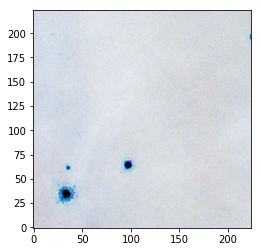

In [9]:
plt.imshow(images[:, :, :, 2000])

In [10]:
tsne = np.load('/Users/crjones/Documents/Science/HargisDDRF/Carina/carina_tsne_coords.npy')

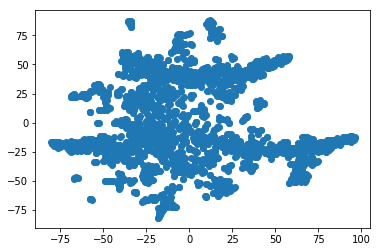

In [11]:
plt.scatter(tsne[:,0], tsne[:, 1], edgecolor=None)

In [12]:
dist_tsne_grid = np.zeros([tsne.shape[0], tsne.shape[0]])
dist_real_grid = np.zeros([tsne.shape[0], tsne.shape[0]])
diag = np.zeros([tsne.shape[0], tsne.shape[0]])

for i in np.arange(tsne.shape[0]):
    for j in np.arange(tsne.shape[0]):
        dist_tsne_grid[i, j] = np.sqrt((tsne[i, 0]-tsne[j,0])**2 + (tsne[i, 1]-tsne[j, 1])**2)
        diag[i,j] = i != j
        dist_real_grid[i, j] = np.sqrt((trc_coords[i, 0]-trc_coords[j,0])**2 + (trc_coords[i, 1]-trc_coords[j, 1])**2)


In [13]:
wh = np.asarray(np.where(np.ravel((dist_tsne_grid < 1) & (dist_real_grid > 1024) & (diag == 1.0))))

In [117]:
images[:, :, : 2000]

array([[[[  51.,   48.,   48., ...,   54.,   46.,   43.],
         [  66.,   64.,   71., ...,   67.,   52.,   52.],
         [  69.,   71.,   74., ...,   54.,   43.,   51.]],

        [[  50.,   49.,   50., ...,   54.,   45.,   43.],
         [  70.,   67.,   72., ...,   62.,   57.,   55.],
         [  78.,   64.,   73., ...,   66.,   48.,   54.]],

        [[  48.,   47.,   52., ...,   56.,   45.,   44.],
         [  71.,   67.,   67., ...,   63.,   49.,   54.],
         [  79.,   67.,   66., ...,   68.,   50.,   53.]],

        ..., 
        [[  68.,   67.,   74., ...,   37.,   36.,   34.],
         [  85.,   73.,   87., ...,   46.,   24.,   29.],
         [  83.,   63.,   74., ...,   38.,   27.,   25.]],

        [[  66.,   65.,   75., ...,   35.,   37.,   34.],
         [  75.,   77.,   84., ...,   32.,   40.,   35.],
         [  81.,   72.,   71., ...,   34.,   36.,   34.]],

        [[  62.,   60.,   75., ...,   34.,   35.,   34.],
         [  77.,   74.,   82., ...,   32.,   40.

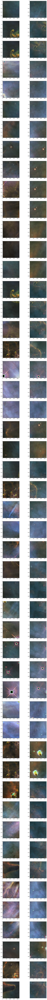

In [132]:
npair = 50
f, axarr = plt.subplots(npair, 2, figsize=[10, 4*npair])
for ii in np.arange(npair):
    plt.axis("off")
    im1 = np.mod(wh[0,ii], tsne.shape[0])
    im2 = int(np.floor(wh[0,ii]/tsne.shape[0]))
    axarr[ii, 0].imshow(255-(images[:, :, :, im1]))
    axarr[ii, 1].imshow(255-images[:, :, :, im2])
plt.savefig("pairs.jpg")

In [288]:
def show_similar(x, y, nsimilar, ):
    scale=200.0
    f, axarr = plt.subplots(1, 2, figsize=[2500/scale, 1500/scale])
    axarr[0].axis("off")
    trc_in = np.argmin((trc_coords[:,0]-x)**2+(trc_coords[:,1]-y)**2)
    dists = np.ravel(dist_tsne_grid[trc_in, :])
    closest = (np.argsort(dists))[0:nsimilar]
    #plt.ylim(0, 3500)
    #plt.xlim(0, 2500)
    axarr[0].imshow(imarr)
    #axarr[0].ylim
    print(trc_in)
    for i in closest:
        plot_trc_box(axarr[0], i, 'white', dists[i])
    plot_trc_box(axarr[0], trc_in, 'cyan', 0.001)
    axarr[1].scatter(tsne[:,0], tsne[:, 1], facecolors='black', edgecolor='black', alpha=0.2)
    for i in closest: 
        axarr[1].scatter(tsne[i,0], tsne[i, 1], facecolors=None, edgecolor='white', alpha=np.clip(2.0/dists[i], 0, 1))
    axarr[1].scatter(tsne[trc_in,0], tsne[trc_in, 1], facecolors='cyan', edgecolor='cyan')
    axarr[1].set_aspect(1.3)
    f.tight_layout()
    #axarr[1].show()
    #plt.savefig('similar_{:d}'.format(trc_in))

In [289]:
def plot_trc_box(ax, trc_in, clr, dd):
    ax.plot([trc_coords[trc_in, 1], trc_coords[trc_in, 1], 
                                                            trc_coords[trc_in, 1]+xs,
                                                            trc_coords[trc_in, 1]+xs,trc_coords[trc_in, 1]],
             [trc_coords[trc_in, 0], trc_coords[trc_in, 0]+xs, trc_coords[trc_in, 0]+xs,
             trc_coords[trc_in, 0],trc_coords[trc_in, 0]], color=clr, alpha=np.clip(1.0/dd, 0, 1))

1461


/Users/jegpeek/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: RuntimeWarning: divide by zero encountered in double_scalars
/Users/jegpeek/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:18: RuntimeWarning: divide by zero encountered in double_scalars


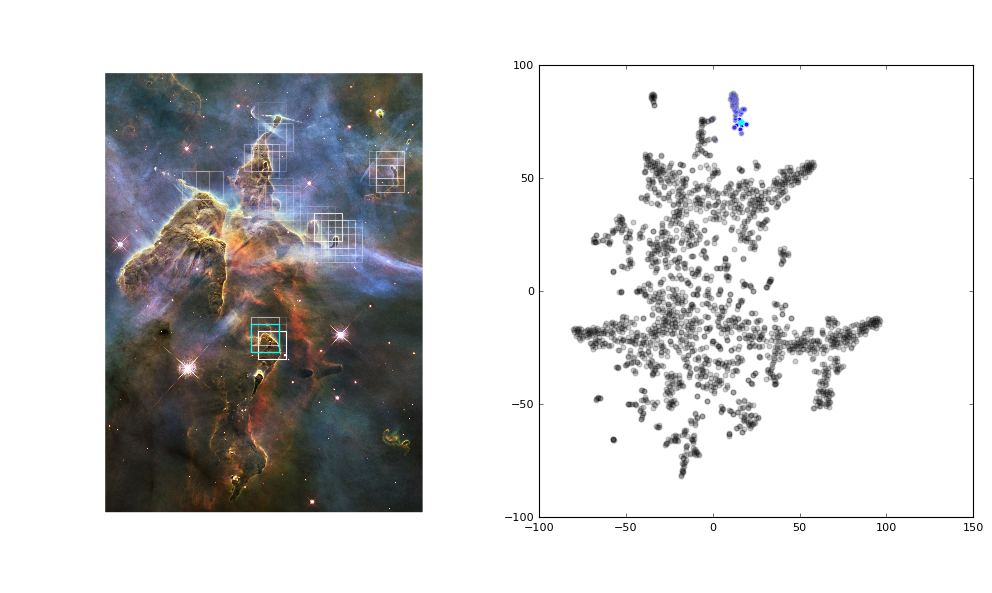

In [290]:
show_similar(2000,1200,50)

741


/Users/jegpeek/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: RuntimeWarning: divide by zero encountered in double_scalars


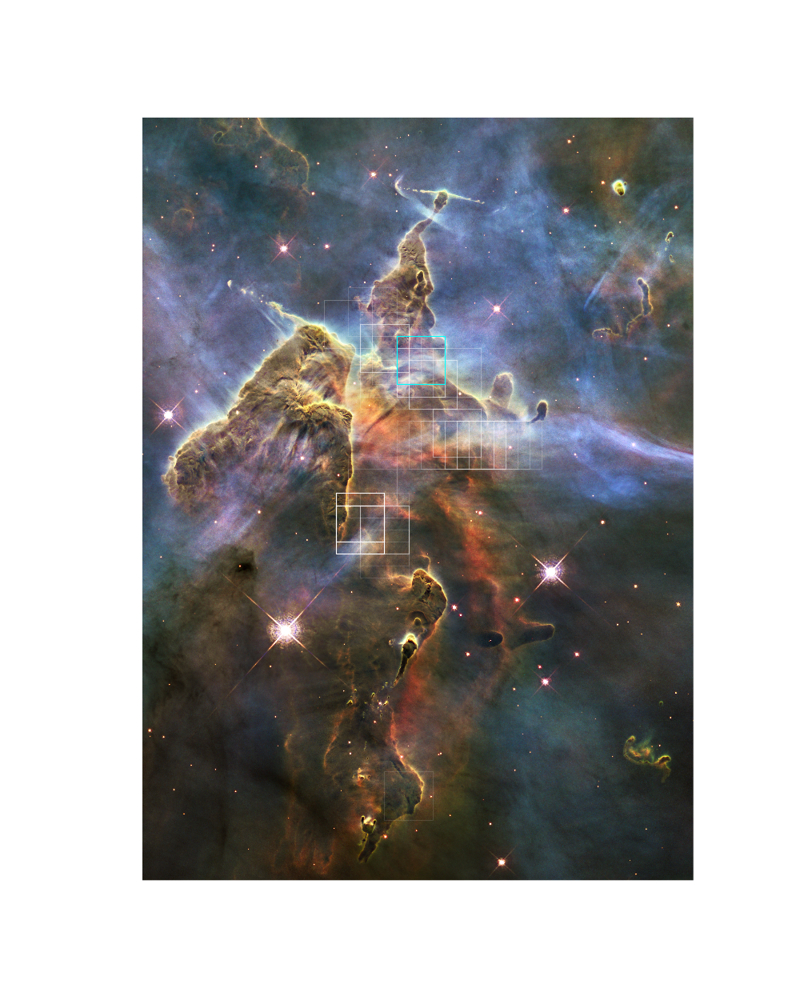

In [148]:
show_similar(1000,1200,30)

729


/Users/jegpeek/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: RuntimeWarning: divide by zero encountered in double_scalars


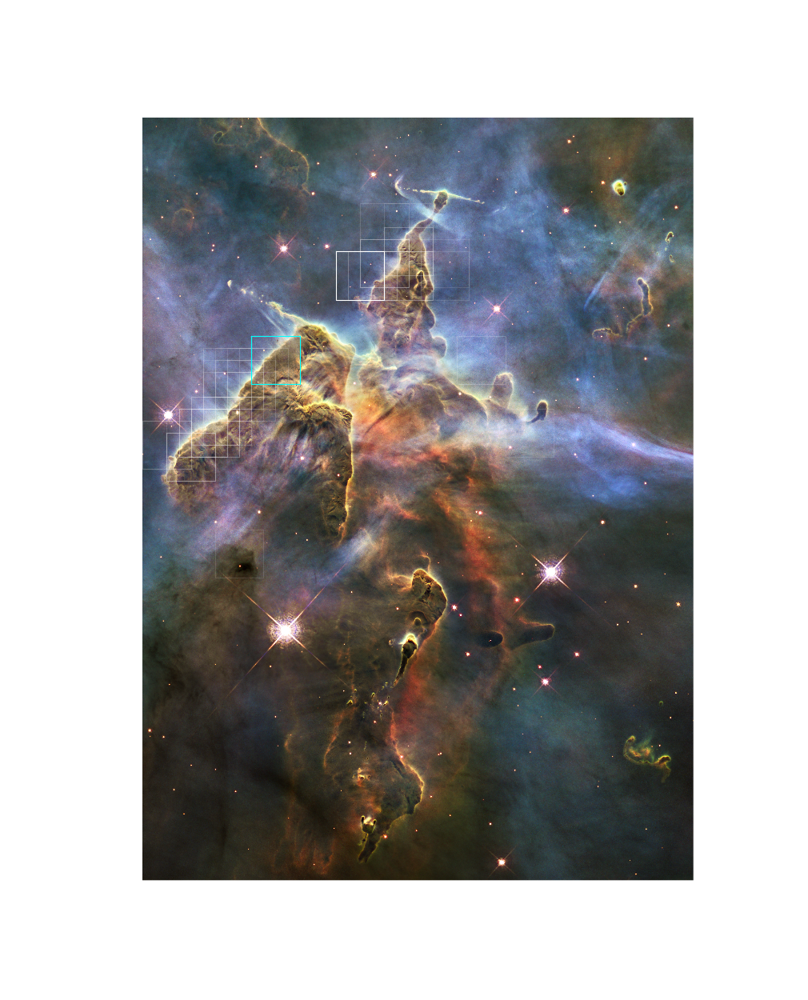

In [152]:
show_similar(1000,500,30)

In [90]:
data

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9.])

In [91]:
data[0] = 3.5
data[5] = 2.5
data[9] = 0.5

In [92]:
data

array([ 3.5,  1. ,  2. ,  3. ,  4. ,  2.5,  6. ,  7. ,  8. ,  0.5])

In [95]:
data[np.argsort(data)]

array([ 0.5,  1. ,  2. ,  2.5,  3. ,  3.5,  4. ,  6. ,  7. ,  8. ])

In [236]:
? plt.ylim